<a href='https://www.hexnbit.com/'> <img src='https://www.hexnbit.com/wp-content/uploads/2019/09/hexnbit_final_66px.png'/> </a>

### <span style="color: brown;">Problem statement</span>

To classify a given silhouette as one of four types of vehicle, using  a set of features extracted from the silhouette. Thevehicle may be viewed from one of many different angles

### <span style="color: brown;">Description of Dataset</span>

The data contains features extracted from the silhouette of vehicles in different angles. Four "Corgie" model vehicles were used for the experiment: a double decker bus, Cheverolet van, Saab 9000 and an Opel Manta 400 cars. This particular combination of vehicles was chosen with the expectation that the bus, van and either one of the cars would be readily distinguishable, but it would be more difficult to distinguish between the cars

### <span style="color: brown;">Vehicle Classification</span>

The purpose of the case study is to classify a given silhouette as one of four different types of vehicle, using a set of features extracted from the silhouette. The vehicle may be viewed from one of many different angles. Four "Corgie" model vehicles were used for the experiment: a double decker bus, Cheverolet van, Saab 9000 and an Opel Manta 400 cars. This particular combination of vehicles was chosen with the expectation that the bus, van and either one of the cars would be readily distinguishable, but it would be more difficult to distinguish between the cars. The purpose is to classify a given silhouette as one of three types of vehicle, using a set of features extracted from the silhouette. The vehicle may be viewed from one of many different angles.

### <span style="color: brown;">Data Dictionary</span>

- 1- compactness
- 2- circularity
- 3- distance_circularity
- 4- radius_ratio
- 5- pr.axis_aspect_ratio
- 6- max.length_aspect_ratio
- 7- scatter_ratio
- 8- elongatedness
- 9- pr.axis_rectangularity
- 10- max.length_rectangularity
- 11- scaled_variance
- 12- scaled_variance.1
- 13- scaled_radius_of_gyration
- 14- scaled_radius_of_gyration.1
- 15- skewness_about
- 16- skewness_about.1
- 17- skewness_about.2
- 18- hollows_ratio
- 19- class

### <span style="color: brown;">Importing Required Modules</span>

In [1]:
import numpy as np                                                         #importing numpy                             
import pandas as pd                                                        #importing pandas
import seaborn as sns                                                      #import seaborn
import matplotlib.pyplot as plt                                            #import matplotlib
from sklearn import metrics                                                #import metrics
from sklearn.linear_model import LogisticRegression                        #import Logistic Regression
from sklearn.model_selection import train_test_split                       #import train_test
from sklearn.metrics import classification_report, confusion_matrix        #importing classification_report, confusion_matrix
from sklearn.tree import DecisionTreeClassifier                            #importing DecisionTree
from sklearn import tree                                                   #importing tree
from sklearn.svm import SVC                                                #importing SVC
from sklearn.model_selection import GridSearchCV                           #importing GridSearch
from sklearn.cluster import KMeans                                         #importing KMeans
%matplotlib inline

### <span style="color: brown;">Read the dataset</span>

In [2]:
df = pd.read_csv('vs.csv')                                  #load the csv file and make the data frame
df.head()                                                   #previewing

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48,83,178,72,10,162,42,20,159,176,379,184,70,6,16,187,197,van
1,91,41,84,141,57,9,149,45,19,143,170,330,158,72,9,14,189,199,van
2,104,50,106,209,66,10,207,32,23,158,223,635,220,73,14,9,188,196,saab
3,93,41,82,159,63,9,144,46,19,143,160,309,127,63,6,10,199,207,van
4,85,44,70,205,103,52,149,45,19,144,241,325,188,127,9,11,180,183,bus


- It shows that there are 18 independent variables (compactness, circularity, distance_circularity, radius_ratio, pr.axis_aspect_ratio, max.length_aspect_ratio, scatter_ratio, elongatedness, pr.axis_rectangularity, max.length_rectangularity, scaled_variance, scaled_variance.1, scaled_radius_of_gyration, scaled_radius_of_gyration.1, skewness_about, skewness_about.1, skewness_about.2, hollows_ratio) and one dependent variable (class).
- Only the class variable is non numeric others are numeric.

### <span style="color: brown;">Check for Missing Data</span>

In [3]:
nulldata = pd.DataFrame(df.isnull().sum())           #checking for null values in the data
nulldata.columns = ['Null values']                   #Remaning the column
nulldata                                             #previewing the data 

,Null values
compactness,0
circularity,0
distance_circularity,0
radius_ratio,0
pr.axis_aspect_ratio,0
max.length_aspect_ratio,0
scatter_ratio,0
elongatedness,0
pr.axis_rectangularity,0
max.length_rectangularity,0


### <span style="color: brown;">Exploratory Data Analysis</span>

### Data Preprocessing (Understanding the data)

In [4]:
df.info()                                                    #To show the detailed summary

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   compactness                  846 non-null    int64 
 1   circularity                  846 non-null    int64 
 2   distance_circularity         846 non-null    int64 
 3   radius_ratio                 846 non-null    int64 
 4   pr.axis_aspect_ratio         846 non-null    int64 
 5   max.length_aspect_ratio      846 non-null    int64 
 6   scatter_ratio                846 non-null    int64 
 7   elongatedness                846 non-null    int64 
 8   pr.axis_rectangularity       846 non-null    int64 
 9   max.length_rectangularity    846 non-null    int64 
 10  scaled_variance              846 non-null    int64 
 11  scaled_variance.1            846 non-null    int64 
 12  scaled_radius_of_gyration    846 non-null    int64 
 13  scaled_radius_of_gyration.1  846 no

- It gives the description about the number of rows, columns , their data types, memory usage and number of null values of each columnns

In [5]:
df.describe()                                                #Analyze the distribution of the dataset

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
count,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.00000,846.000000,846.000000,846.000000,846.000000,846.000000
mean,93.678487,44.861702,82.088652,168.940898,61.693853,8.567376,168.839243,40.933806,20.582742,147.998818,188.625296,439.911348,174.70331,72.462175,6.377069,12.599291,188.932624,195.632388
std,8.234474,6.169866,15.771533,33.472183,7.888251,4.601217,33.244978,7.811560,2.592138,14.515652,31.394837,176.692614,32.54649,7.486974,4.918353,8.931240,6.163949,7.438797
min,73.000000,33.000000,40.000000,104.000000,47.000000,2.000000,112.000000,26.000000,17.000000,118.000000,130.000000,184.000000,109.00000,59.000000,0.000000,0.000000,176.000000,181.000000
25%,87.000000,40.000000,70.000000,141.000000,57.000000,7.000000,146.250000,33.000000,19.000000,137.000000,167.000000,318.250000,149.00000,67.000000,2.000000,5.000000,184.000000,190.250000
50%,93.000000,44.000000,80.000000,167.000000,61.000000,8.000000,157.000000,43.000000,20.000000,146.000000,178.500000,364.000000,173.00000,71.500000,6.000000,11.000000,188.000000,197.000000
75%,100.000000,49.000000,98.000000,195.000000,65.000000,10.000000,198.000000,46.000000,23.000000,159.000000,217.000000,587.000000,198.00000,75.000000,9.000000,19.000000,193.000000,201.000000
max,119.000000,59.000000,112.000000,333.000000,138.000000,55.000000,265.000000,61.000000,29.000000,188.000000,320.000000,1018.000000,268.00000,135.000000,22.000000,41.000000,206.000000,211.000000


- It gives the descriptive statistics (mean, median, mode, percentiles, min, max, standard deviation) of the columns of the dataset.
- From the above decription we can understand that compactness, circularity, distance_circularity, elongatedness, pr.axis_rectangularity, max.length_rectangularity, scaled_radius_of_gyration, scaled_radius_of_gyration.1, skewness_about.2, hollows_ratio are approximately normally distributed.
- And radius_ratio, pr.axis_aspect_ratio, max.length_aspect_ratio, scatter_ratio, scaled_variance, scaled_variance.1, skewness_about, skewness_about.1 are approx. right skewed distribution.

In [6]:
df.dtypes                                                    #It shows data types of columns

compactness                     int64
circularity                     int64
distance_circularity            int64
radius_ratio                    int64
pr.axis_aspect_ratio            int64
max.length_aspect_ratio         int64
scatter_ratio                   int64
elongatedness                   int64
pr.axis_rectangularity          int64
max.length_rectangularity       int64
scaled_variance                 int64
scaled_variance.1               int64
scaled_radius_of_gyration       int64
scaled_radius_of_gyration.1     int64
skewness_about                  int64
skewness_about.1                int64
skewness_about.2                int64
hollows_ratio                   int64
class                          object
dtype: object

In [7]:
df.shape                                                     #It shows the number of rows and columns

(846, 19)

In [8]:
df.columns                                                   #It shows the columns in a dataset

Index(['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio', 'class'],
      dtype='object')

### <span style="color: brown;"> Understanding the outier using different plots</span>

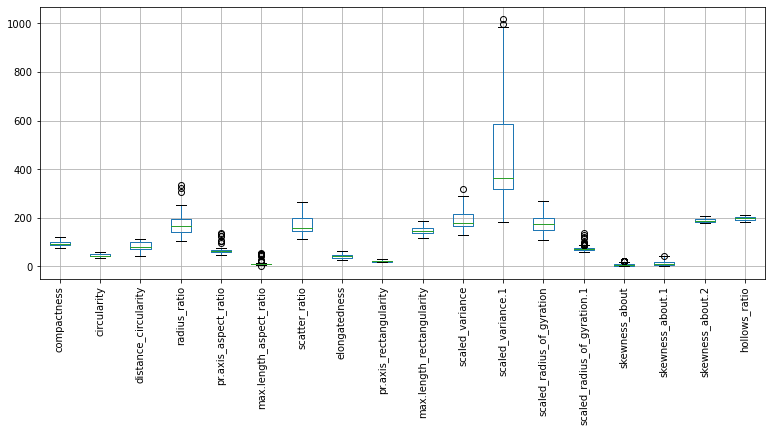

In [9]:
axes = df.boxplot(figsize= (13,5))                           #boxplot
lab = axes.get_xticklabels()                             
axes.set_xticklabels(lab, rotation=90)                       #rotating the labels by 90 degrees 
plt.show() 

**Inference**<br>
It is showing that there are some columns which contains outliers such as radius_ratio, pr.axis_aspect_ratio, max.length_aspect_ratio, scaled_variance, scaled_variance.1, skewness_about, skewness_about.1.

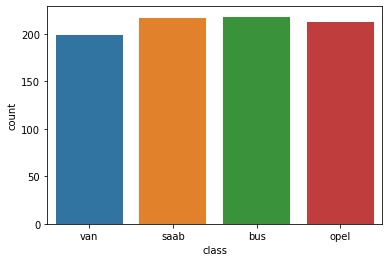

In [10]:
sns.countplot(x = 'class', data = df)                        #countplot for variable class
plt.show()

**Inference**<br>
The above count plot shows the count of all the four different vehicles

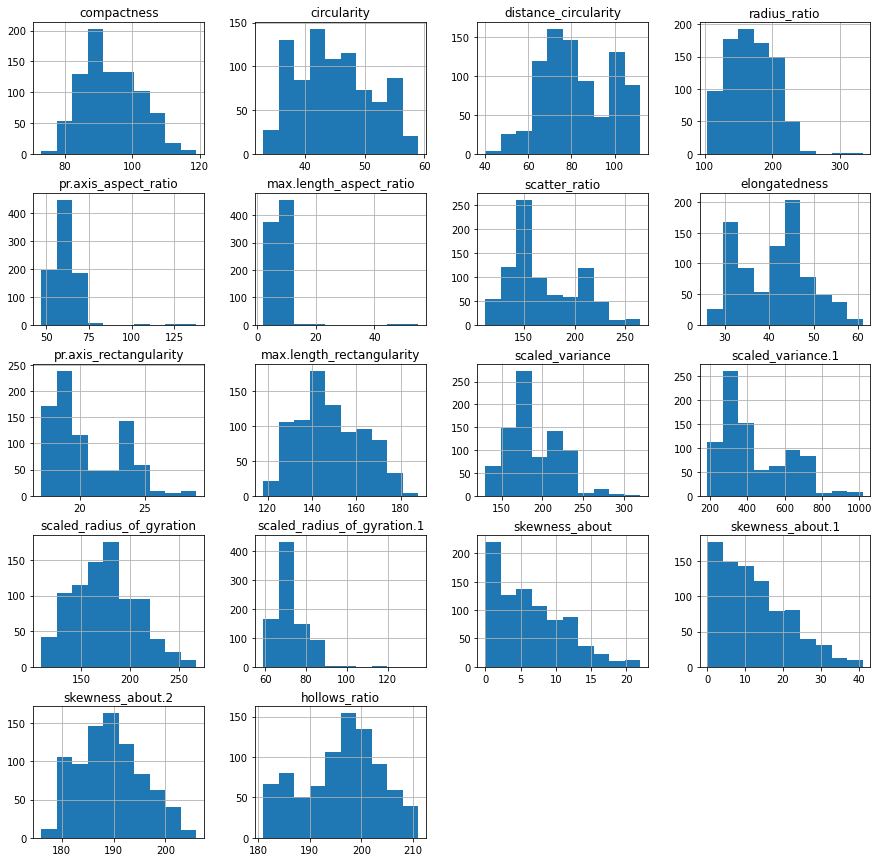

In [11]:
df.hist(figsize=(15,15))                                     #hist plot
plt.show()

**Inference**<br>
The above histogram shows the comparision of all the columns in the dataset.

C:\Users\YASASWINI DESU\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


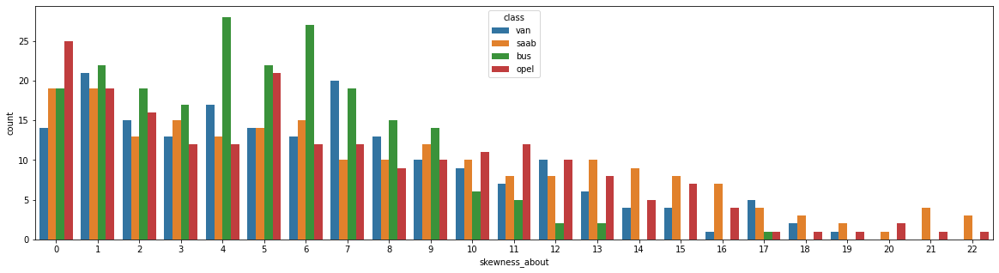

In [12]:
plt.figure(figsize=(20,5))                                                 
sns.countplot(df['skewness_about'],hue= df['class'])                        #countplot for skweness_about and class
plt.show()

**Inference**<br>
The countplot compares between skewness_about and class.

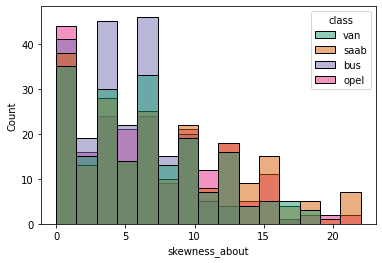

In [13]:
sns.histplot(data=df, x="skewness_about", hue="class",palette='Dark2')      #histplot for skweness_about and class
plt.show()

**Inference**<br>
- Most of the data attributes seems to be normally distributed.
- Scaled valriance 1 and skewness about 1 and 2, scatter_ratio, seems to be right skwed.
- pr.axis_rectangularity seems to be haing outliers as there are some gaps found in the bar plot.

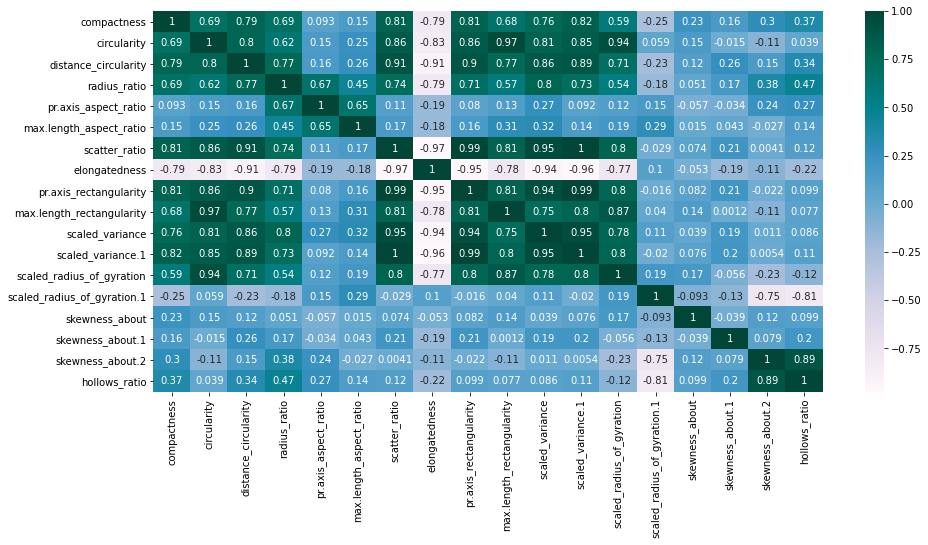

In [14]:
plt.figure(figsize=(15,7))
sns.heatmap(df.corr(), annot = True, cmap = 'PuBuGn')                      #heatmap of correlation
plt.show()

**Inference**<br>
- It shows that there are some attributes which are highly correlated as there corelation value is very high.
- For example: compactness is highly correlated in a positive way with scatter_ratio, pr.axis_rectangularity, scaled_variance1, distance_circularity, scaled_variance, radius_ratio. compactness is highly correlated in a negative way with elongatedness

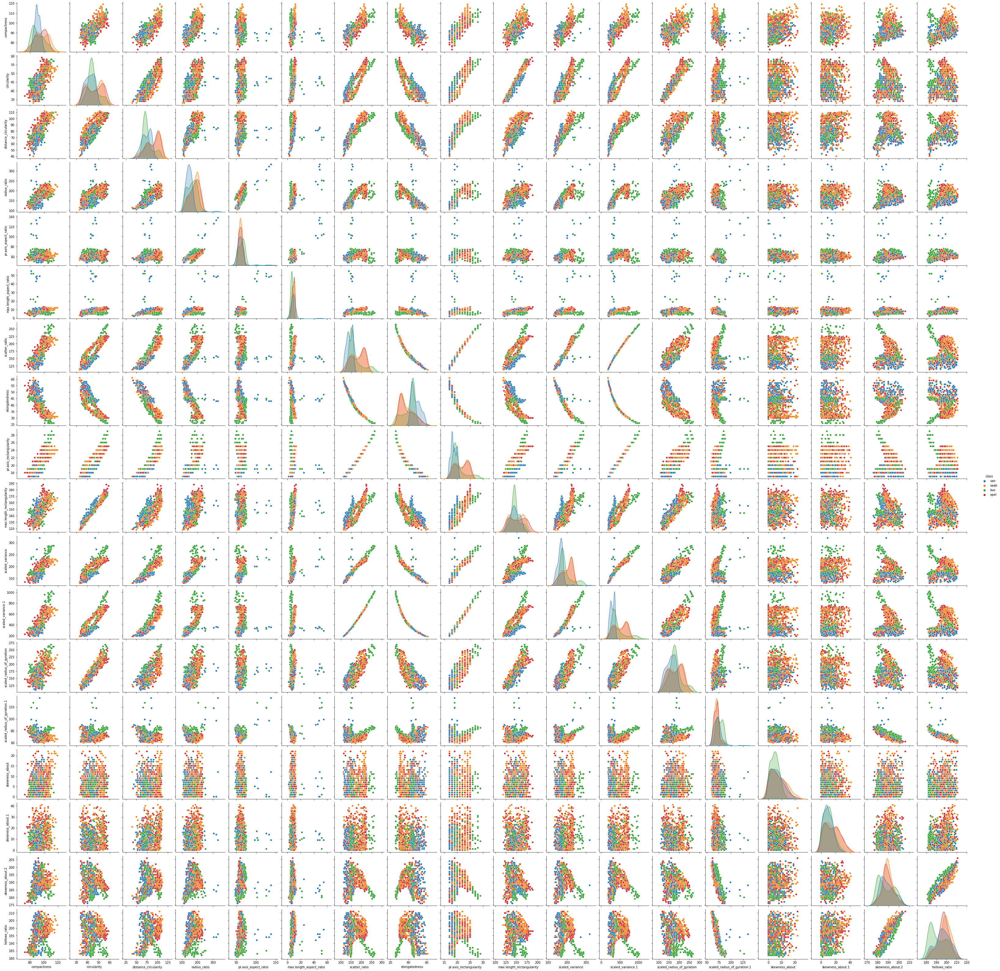

In [15]:
sns.pairplot(df,hue='class')                                           #pairplot           

**Inference**<br>
- It is also showing the same information as correlation matrix.
- compactness has positive linear relationship with circularity, distance_circularity, radius_ratio, scatter_ratio, pr.axis_rectangularity, max.axis_rectangularity, scaled_variance1, scaled_variance. compactness has negative linear relationship with elongatedness.
- circularity has positive linear relationship with distance_circularity, scatter_ratio, pr.axis_rectangularity, max.axis_rectangularity, scaled_variance, scaled_variance1, scaled_radius_of_gyration. circularity has negative linear relationship with elongatedness.
- distance_circularity has positive linear relationship with radius_ratio, scatter_ratio, pr.axis_rectangularity, max.axis_rectangularity, scaled_variance, scaled_variance1, scaled_radius_of_gyration. distance_circularity has negative linear relationship with elongatedness.
- radius_ratio has positive linear relationship with pr.axis_aspect_ratio, scatter_ratio, scaled_variance, scaled_variance1, scaled_radius_of_gyration. radius_ratio has negative linear relationship with elongatedness.

### <span style="color: brown;"> Apply different Classification Algorithms and tune them</span>


### Split Data for Training and Testing

In [16]:
Y = df['class']                                                            #copying class column to Y
df.drop('class', axis = 1,inplace = True)                                  #dropping the column class

In [17]:
X_train, X_test, y_train, y_test = train_test_split(df,Y, test_size=0.3)   #splitting data into train and test

### <span style="color:brown;"> Logistic Regression Model</span>


### Training and Predicting

In [18]:
model = LogisticRegression(max_iter =900)                                  #Using LogisticRegression
model.fit(X_train,y_train)                                                  

C:\Users\YASASWINI DESU\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(max_iter=900)

### Predicting

In [19]:
predictions = model.predict(X_test)                                        #Predicting
#predictions

### Evaluation

In [20]:
cnf_matrix=confusion_matrix(y_test,predictions)                            #Confusion matrix for testdata and predicted data
cnf_matrix   

array([[65,  0,  0,  2],
       [ 2, 35, 25,  3],
       [ 3, 11, 46,  0],
       [ 1,  0,  0, 61]], dtype=int64)

### Heapmap for Confusion Matrix

<AxesSubplot:>

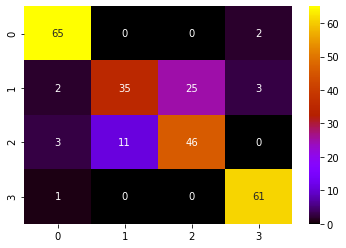

In [21]:
sns.heatmap(cnf_matrix, annot=True, fmt='g',cmap='gnuplot')               #heapmap for confusion matrix

### Classification Report

In [22]:
#Classification report measures the quality of predictions
print(classification_report(y_test,predictions))                           #printing the classification report

              precision    recall  f1-score   support

         bus       0.92      0.97      0.94        67
        opel       0.76      0.54      0.63        65
        saab       0.65      0.77      0.70        60
         van       0.92      0.98      0.95        62

    accuracy                           0.81       254
   macro avg       0.81      0.81      0.81       254
weighted avg       0.81      0.81      0.81       254



In [23]:
#accuracy, recall value, precision value
print("Accuracy Score is:",metrics.accuracy_score(y_test,predictions))                        
print('Recall value: ',metrics.recall_score(y_test, predictions, average='macro'))
print('Precision value: ',metrics.precision_score(y_test, predictions, average='macro'))

Accuracy Score is: 0.8149606299212598
Recall value:  0.814787106650371
Precision value:  0.8121230677874891


### Accuracy

In [24]:
Logistic_Regression_Accuracy =  metrics.accuracy_score(y_test,predictions)  #accuracy of logistic regression

### Creating DataFame to roughly compare actual outputs and predicted outputs

In [25]:
compare_logistic = pd.DataFrame({"Actual":y_test,"Predicted":predictions})  #actual vs predicted
compare_logistic

,Actual,Predicted
481,opel,opel
814,bus,bus
510,bus,van
219,van,van
383,opel,opel
...,...,...
675,opel,opel
226,saab,saab
449,van,van
785,bus,bus


### <span style="color: brown;">Decision Tree</span>

In [26]:
X_train, X_test, y_train, y_test = train_test_split(df,Y, test_size=0.30)  #training the model

### Training and Predicting

In [27]:
dec_model = DecisionTreeClassifier(max_depth = 6,random_state = 0,criterion = "entropy")      #decision tree classifier
dec_model.fit(X_train,y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=6, random_state=0)

### Predicting

In [28]:
Predictions=model.predict(X_test)                                   #predicting
#Predictions

### Model Evaluation

In [29]:
print(confusion_matrix(y_test, Predictions))                         #confusion matrix

[[54  1  0  1]
 [ 0 41 20  1]
 [ 6 20 47  2]
 [ 1  0  0 60]]


In [30]:
print(classification_report(y_test, Predictions))                    #classification report

              precision    recall  f1-score   support

         bus       0.89      0.96      0.92        56
        opel       0.66      0.66      0.66        62
        saab       0.70      0.63      0.66        75
         van       0.94      0.98      0.96        61

    accuracy                           0.80       254
   macro avg       0.80      0.81      0.80       254
weighted avg       0.79      0.80      0.79       254



In [31]:
Decision_Tree_Accuracy = metrics.accuracy_score(y_test,Predictions)  #printing the accuarcy of decision tree classifier

### Creating DataFame to roughly compare actual outputs and predicted outputs

In [32]:
compare_decision = pd.DataFrame({"Actual":y_test,"Predicted":Predictions})  #actual vs predicted
compare_decision

,Actual,Predicted
124,van,van
88,bus,bus
659,saab,saab
533,van,van
498,van,van
...,...,...
190,opel,opel
328,van,van
59,van,van
625,saab,opel


### Visualising Decision Tree

In [33]:
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (100,50), dpi = 400)   #decision tree
tree.plot_tree(dec_model,filled = True, rounded=True);

### <span style="color: brown;">Support Vector Classifier (SVM)</span>

In [36]:
svc_model = SVC()                                                             #SVM Classifier
svc_model.fit(X_train,y_train)

SVC()

### Predicting

In [35]:
predict = svc_model.predict(X_test)                                           #predicting
#predict

### Model Evaluation

In [37]:
print(confusion_matrix(y_test, predict))                                      #printing the confusion matrix

[[40  9  5  2]
 [18 23  7 14]
 [16 35  9 15]
 [17  0  0 44]]


In [38]:
print(classification_report(y_test, predict))                                #printing the classification report

              precision    recall  f1-score   support

         bus       0.44      0.71      0.54        56
        opel       0.34      0.37      0.36        62
        saab       0.43      0.12      0.19        75
         van       0.59      0.72      0.65        61

    accuracy                           0.46       254
   macro avg       0.45      0.48      0.43       254
weighted avg       0.45      0.46      0.42       254



In [39]:
SVC_Accuracy = metrics.accuracy_score(y_test,predict)                          #printing the accuarcy of decision tree classifier

### Creating DataFame to roughly compare actual outputs and predicted outputs

In [40]:
compare_svc = pd.DataFrame({"Actual":y_test,"Predicted":predict})              #actual vs predicted
compare_svc

,Actual,Predicted
124,van,van
88,bus,bus
659,saab,saab
533,van,van
498,van,van
...,...,...
190,opel,saab
328,van,van
59,van,van
625,saab,opel


### <span style="color: brown;">Hyper Parameter Tuning using GridSearch</span>

In [41]:
# Dictionary containing hyperparameters to be tuned and their values to be tested
grid_parameters = {'C': [0.001,0.1,1, 10, 100, 1000], 'gamma': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100]} 

In [42]:
grid = GridSearchCV(SVC(),grid_parameters,verbose=1)                          #gridsearchcv

In [43]:
grid.fit(X_train,y_train)                                          

Fitting 5 folds for each of 42 candidates, totalling 210 fits


GridSearchCV(estimator=SVC(),
             param_grid={'C': [0.001, 0.1, 1, 10, 100, 1000],
                         'gamma': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100]},
             verbose=1)

### Prediction using tuned model

In [44]:
grid_prediction = grid.predict(X_test)                             #predicting

In [45]:
print(confusion_matrix(y_test,grid_prediction))                    #printing the confusion matrix

[[56  0  0  0]
 [ 1 42 17  2]
 [ 3 28 42  2]
 [ 0  1  1 59]]


In [46]:
print(classification_report(y_test,grid_prediction))               #printing the classification report

              precision    recall  f1-score   support

         bus       0.93      1.00      0.97        56
        opel       0.59      0.68      0.63        62
        saab       0.70      0.56      0.62        75
         van       0.94      0.97      0.95        61

    accuracy                           0.78       254
   macro avg       0.79      0.80      0.79       254
weighted avg       0.78      0.78      0.78       254



In [47]:
compare_svm = pd.DataFrame({"Actual":y_test,"Predicted":grid_prediction})        #actual vs predicted
compare_svm

,Actual,Predicted
124,van,van
88,bus,bus
659,saab,opel
533,van,van
498,van,van
...,...,...
190,opel,opel
328,van,van
59,van,van
625,saab,saab


In [48]:
SVM_Accuracy = metrics.accuracy_score(y_test, grid_prediction)           #svm accuracy after tuning

### <span style="color: brown;">K Means</span>

In [49]:
X_train, X_test, y_train, y_test = train_test_split(df,Y, test_size=0.30) #splitting into test and train

In [50]:
X = df.loc[:, ['compactness', 'circularity', 'distance_circularity', 'radius_ratio',   #all the columns
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio']]

### Elbow Plot

C:\Users\YASASWINI DESU\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


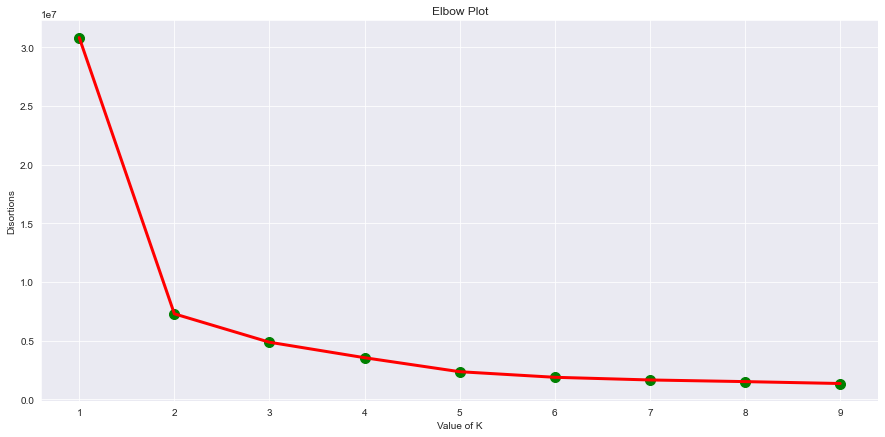

In [51]:
plt.figure(figsize=(15,7))
sns.set_style('darkgrid')
disortions = []                                                
for k in range(1, 10):                                         #We want k values from 1 to 10
    kmeans = KMeans(n_clusters = k)                            #initializing KMeans
    kmeans.fit(X)                                              #clustering
    disortions.append(kmeans.inertia_)                         #Inertia is the sum of squared error for each cluster
    
plt.scatter(range(1, 10), disortions ,c = 'g', s = 100)        #scattering for better reference
plt.plot(range(1, 10), disortions, c = 'r', linewidth = 3)     #plot an elbow model 
plt.title('Elbow Plot')                                        #giving title for the plot
plt.xlabel('Value of K')                                       #Adding the label for x-axis
plt.ylabel('Disortions')                                       #Adding the label for y-axis
plt.show()                                                     #previewing the plot

### Initializing K-Means

In [52]:
km = KMeans(n_clusters = 4, random_state=101)                   #Number of clsuters is 4
y = km.fit_predict(X)       

### Getting clusters

In [53]:
cluster = km.labels_                                            #getting the values
#cluster = pd.DataFrame(data = cluster, columns = ['Cluster'])  #dataframe for clusters
#cluster.head()
#cluster

### Getting clusters of final cluster

In [54]:
centers = km.cluster_centers_                                   #getting centers of final cluster
centers                                                         #previewing

array([[ 89.20612813,  42.77715877,  75.68523677, 158.2367688 ,
         62.91364903,   8.80779944, 153.50417827,  43.55431755,
         19.29805014, 143.79665738, 176.1810585 , 350.53760446,
        165.77158774,  73.61281337,   6.        ,  10.99721448,
        188.35097493, 194.8718663 ],
       [104.37234043,  53.48404255, 102.84042553, 200.57978723,
         61.66489362,   9.77659574, 219.62765957,  30.39361702,
         24.61702128, 167.71276596, 232.13829787, 715.46276596,
        216.25      ,  73.19148936,   7.37765957,  15.95212766,
        187.5212766 , 195.78723404],
       [ 98.06870229,  46.70229008,  93.21374046, 198.40458015,
         64.02290076,   8.59541985, 187.45801527,  35.06870229,
         21.90076336, 150.19847328, 207.55725191, 530.7480916 ,
        183.26717557,  68.29007634,   6.06870229,  13.38931298,
        193.10687023, 200.03816794],
       [ 87.8452381 ,  38.23214286,  63.875     , 133.43452381,
         57.30357143,   6.67857143, 130.25595238,  51.702

### Scatter plot as per the clustered

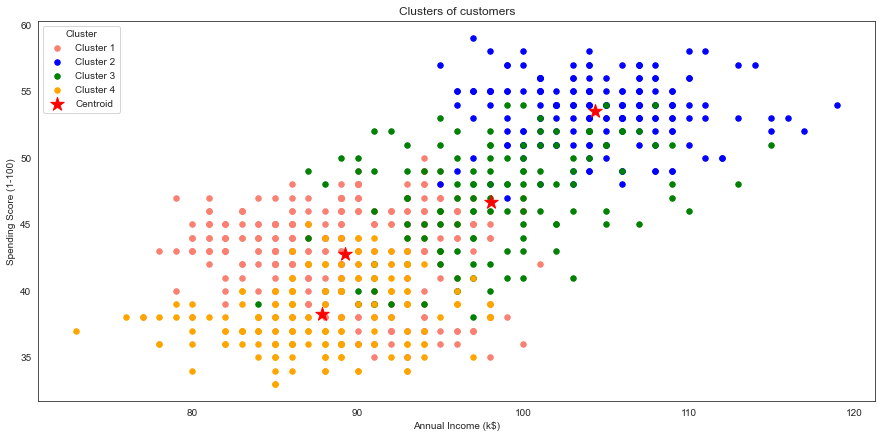

In [55]:
plt.figure(figsize=(15,7))
sns.set_style('white')                                                                            #setting style as white
plt.scatter(X.iloc[y == 0, 0], X.iloc[y == 0, 1], s = 30, c = 'salmon', label = 'Cluster 1')      #scatter plot for cluster1                
plt.scatter(X.iloc[y == 1, 0], X.iloc[y == 1, 1], s = 30, c = 'blue', label = 'Cluster 2')        #scatter plot for cluster2
plt.scatter(X.iloc[y == 2, 0], X.iloc[y == 2, 1], s = 30, c = 'green', label = 'Cluster 3')       #scatter plot for cluster3
plt.scatter(X.iloc[y == 3, 0], X.iloc[y == 3, 1], s = 30, c = 'orange', label = 'Cluster 4')      #scatter plot for cluster4     
plt.scatter(km.cluster_centers_[:, 0], km.cluster_centers_[:, 1],
            s = 200, c = 'Red', label = 'Centroid',marker = '*')                                  #scatter plot for centroid
plt.title('Clusters of customers')                                                                #Adding title to the scatter plot
plt.xlabel('Annual Income (k$)')                                                                  #Giving label for x-axis
plt.ylabel('Spending Score (1-100)')                                                              #Giving label for y-axis
plt.legend(title = 'Cluster')                                                                     #Adding legend
plt.show()

In [56]:
#Y = df['class']
Y = pd.DataFrame(Y)                                                        
Y['class'].replace({'van':0, 'bus':1,'saab':2,'opel':3},inplace = True)    #replacing the values with silhoutte
z = Y['class']
z

0      0
1      0
2      2
3      0
4      1
      ..
841    2
842    0
843    2
844    2
845    0
Name: class, Length: 846, dtype: int64

In [57]:
print(classification_report(cluster, z))                                 #printing classification report

              precision    recall  f1-score   support

           0       0.50      0.28      0.36       359
           1       0.17      0.20      0.18       188
           2       0.24      0.40      0.30       131
           3       0.17      0.21      0.18       168

    accuracy                           0.27       846
   macro avg       0.27      0.27      0.26       846
weighted avg       0.32      0.27      0.28       846



In [58]:
print(confusion_matrix(cluster,z))                                      #printing confusion matrix

[[100 153  57  49]
 [  0  37  73  78]
 [  0  28  53  50]
 [ 99   0  34  35]]


In [59]:
KMeans_Accuracy = metrics.accuracy_score(cluster, z)                   #accuracy
KMeans_Accuracy

0.26595744680851063

### <span style="color: brown;">Get performance metrics for all the applied classifiers</span>

In [60]:
Accuracy = [Logistic_Regression_Accuracy, Decision_Tree_Accuracy,SVC_Accuracy, SVM_Accuracy,KMeans_Accuracy]    #storing the accuracy in a variable
Models = ['Logistic','Decision','SVM(Before Tuning)','SVM(After Tuning)','Kmeans']                              #storing the column names in variable model
compare = pd.DataFrame()                                                                                        
compare['Model'] = Models                                                                                       #previewing
compare['Accuracy'] = Accuracy
compare

,Model,Accuracy
0,Logistic,0.814961
1,Decision,0.795276
2,SVM(Before Tuning),0.456693
3,SVM(After Tuning),0.783465
4,Kmeans,0.265957


In [61]:
check = sns.light_palette('green',as_cmap=True)                         #setting style to the cmap
display = compare.style.background_gradient(cmap=check)                 #previewing the dataframe
display

,Model,Accuracy
0,Logistic,0.814961
1,Decision,0.795276
2,SVM(Before Tuning),0.456693
3,SVM(After Tuning),0.783465
4,Kmeans,0.265957


### <span style="color: brown;">Visually compare the performance of all classifiers</span>

In [62]:
Accuracies=np.array(Accuracy)                    #initializing the numpy array and storing the accuracy in it
Accuracies=np.multiply(Accuracies,100)           #converting into percentages
Accuracies=np.round(Accuracies,2)                #rounding it 2 decimal points

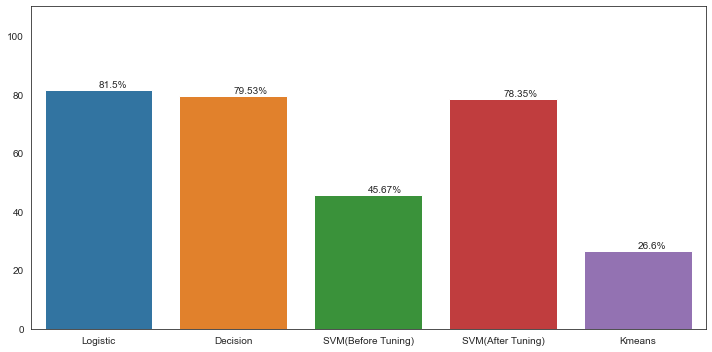

In [63]:
plt.figure(figsize=(10,5))                                                     #resizing the graph
sns.barplot(x=Models,y=Accuracies)                                             #plotting the barplot
plt.ylim((0,110))                                                              #setting ylimit
for index,data in enumerate(Accuracies):                                       #entering into for loop for adding text to bar
    plt.text(x=index , y =data+1 , s=f"{data}%" , fontdict=dict(fontsize=10))  #adding text
plt.tight_layout()
plt.show()

### <span style="color: brown;"> Best possible tuning from all the classifiers</span>

Comparing all the models, we conclude that **Logistic Regression**, **Decision Tree Classifier** and **SVM** gives better results when compared to SVM (before tuning) and KMeans.<br><br>
So we will use either of the above models to predict the silhouette as one of the four types of vehicles.

### <span style="color: brown;">Future scope of improvement in the algorithm</span>

This dataset deals with the classification of vehicles, we can further develop this by using Open CV and Deep Learning which is one of the easiest possible ways to identify the type of vehicle.